## Taxonomic Classification of DNA and RNA Viruses Using Machine Learning

#### Read and Preprocess Protein Sequence Data

In [5]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

class ProteinDataProcessor:
    def __init__(self, file_path):
        self.file_path = file_path
        self.accession_no = []
        self.virus_name = []
        self.sequence = []
        self.family = []
        self.subfamily = []
        self.genus = []

    def read_protein_sequence_data(self):
        with open(self.file_path, "r") as file:
            lines = file.readlines()

        current_accession = None
        current_virus_name = None
        current_sequence = []

        for line in lines:
            line = line.strip()

            if line.startswith(">"):
                parts = line.split(" ")
                current_accession = parts[0].replace(">", "")
                parts_2 = line.split("[")
                current_virus_name = parts_2[1].replace("]", "")
            elif line.startswith("Family:"):
                self.family.append(line.split(":")[1].strip())
            elif line.startswith("Subfamily:"):
                self.subfamily.append(line.split(":")[1].strip())
            elif line.startswith("Genus:"):
                self.genus.append(line.split(":")[1].strip())
            else:
                current_sequence.append(line)

            if not line:
                if current_accession and current_virus_name and current_sequence:
                    self.accession_no.append(current_accession)
                    self.virus_name.append(current_virus_name)
                    self.sequence.append("".join(current_sequence))

                current_accession = None
                current_virus_name = None
                current_sequence = []

    def create_dataframe(self):
        data = {
            "family": self.family,
            "subfamily": self.subfamily,
            "genus": self.genus,
            "virus_name": self.virus_name,
            "accession_no": self.accession_no,
            "sequence": self.sequence
        }

        df = pd.DataFrame(data)
        df = df[["family", "subfamily", "genus", "virus_name", "accession_no", "sequence"]]
        
        # Create a new column named "sequence_length" to store the information of protein sequence lengths
        df["sequence_length"] = [len(seq) for seq in df.loc[:, "sequence"]]
                
        return df

    def clean_dataset(self, df):
        df_filtered = df[(df["sequence_length"] >= 560) & (df["sequence_length"] < 2000)]
        df_no_duplicates = df_filtered.drop_duplicates(subset='sequence')
        return df_no_duplicates

    def filter_dataset_and_save(self, clean_df):
        genus_counts = clean_df['genus'].value_counts()
        selected_genus = genus_counts[genus_counts >= 10].index.tolist()
        filtered_df_no_duplicates = clean_df[clean_df['genus'].isin(selected_genus)]

        result = filtered_df_no_duplicates.groupby(['family', 'subfamily', 'genus'])['genus'].count().reset_index(name='count')
        result.to_csv("summary_virus_seqs.csv", index=False)
        filtered_df_no_duplicates.to_csv("virus_pol_protein_seqs.csv", index=False)
        return filtered_df_no_duplicates, result
    
    def preprocess_data(self, data):
        categories = np.asarray(data.genus.unique())
        label_encoder = LabelEncoder()
        labels = label_encoder.fit_transform(categories)
        labels_categories_mapping = {labels[i]: categories[i] for i in range(len(labels))}

        genus_labels = np.asarray(data.loc[:, "genus"])
        genus_labels = label_encoder.transform(genus_labels)

        sequences = np.asarray(data.loc[:, "sequence"])
        return genus_labels, sequences, labels_categories_mapping 

    def split_and_vectorize_data(self, sequences, genus_labels):
        X_train, X_test, y_train, y_test = train_test_split(sequences, genus_labels, test_size=0.2, random_state=43)
        vect = CountVectorizer(analyzer='char_wb', ngram_range=(4, 4))
        vect.fit(X_train)
        X_train_tf = vect.transform(X_train)
        X_test_tf = vect.transform(X_test)
        return X_train_tf, X_train, X_test_tf, X_test, y_train, y_test


In [6]:
# Assuming you've defined the class and the file path
file_path = "virus_pol_protein_seqs.txt"

# Create an instance of ProteinDataProcessor
data_processor = ProteinDataProcessor(file_path)

# Read protein sequence data from the file
data_processor.read_protein_sequence_data()

# Create a DataFrame from the collected data
df = data_processor.create_dataframe()

# Execute the clean_dataset method inside the class
cleaned_df = data_processor.clean_dataset(df)

# Execute the filter dataset method inside the class
filtered_df, result = data_processor.filter_dataset_and_save(cleaned_df)

# Print summary table to show the protein sequence count for each viral genus
print(result) 

# Preprocess the data
genus_labels, sequences, labels_categories_mapping  = data_processor.preprocess_data(filtered_df)

# Split and vectorize the data
X_train_tf, X_train, X_test_tf, X_test, y_train, y_test = data_processor.split_and_vectorize_data(sequences, genus_labels)


                family           subfamily                genus  count
0        Coronaviridae  Orthocoronavirinae     Alphacoronavirus     27
1        Coronaviridae  Orthocoronavirinae      Betacoronavirus     69
2   Orthoherpesviridae  Alphaherpesvirinae           Mardivirus     10
3   Orthoherpesviridae  Alphaherpesvirinae         Simplexvirus     89
4   Orthoherpesviridae  Alphaherpesvirinae       Varicellovirus     51
5   Orthoherpesviridae   Betaherpesvirinae      Cytomegalovirus     53
6   Orthoherpesviridae   Betaherpesvirinae         Roseolovirus     26
7   Orthoherpesviridae  Gammaherpesvirinae           Percavirus     14
8   Orthoherpesviridae  Gammaherpesvirinae         Rhadinovirus     36
9     Orthomyxoviridae    Orthomyxoviridae  Alphainfluenzavirus     25
10    Orthomyxoviridae    Orthomyxoviridae   Betainfluenzavirus     15
11    Orthomyxoviridae    Orthomyxoviridae  Deltainfluenzavirus     19
12    Orthomyxoviridae    Orthomyxoviridae  Gammainfluenzavirus     14
13    

#### Process, Prepare and Save the Test Dataset for Later MSA-based Phylogenetic Tress Analysis

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

class TestDatasetProcessor:
    def __init__(self, X_test, data):
        self.X_test = X_test
        self.data = data
        self.acc_no_test = []
        self.genus_test = []

    def prepare_fasta_file(self):
        for seq in self.X_test:
            match = self.data[self.data['sequence'] == seq]
            if not match.empty:
                genus = match['genus'].values[0]
                acc_no = match['accession_no'].values[0]
                self.genus_test.append(genus)
                self.acc_no_test.append(acc_no)
            else:
                self.genus_test.append(None)
                self.acc_no_test.append(None)

        self.genus_test = np.array(self.genus_test)
        self.acc_no_test = np.array(self.acc_no_test)

        with open("test_protein_seqs.fasta", "w") as output_file:
            for genus, acc_no, seq in zip(self.genus_test, self.acc_no_test, self.X_test):
                output_file.write(f">{genus}_{acc_no}\n{seq}\n")
        
        print("Formatted sequences saved to 'test_protein_seqs.fasta'")

    def visualize_sequence_lengths(self):
        sequence_lengths = [len(seq) for seq in self.X_test]
        plt.hist(sequence_lengths, bins=20, color='skyblue')
        plt.title('Protein Size Distribution')
        plt.xlabel('Sequence Length')
        plt.ylabel('Frequency')
        plt.show()

    def create_save_test_df(self):
        test_data = {'genus': self.genus_test, 'accession_no': self.acc_no_test, 'sequence': self.X_test}
        test_df = pd.DataFrame(test_data)
        test_df.to_csv('test_dataset.csv', index=False)
        return test_df

    def analyze_dataset_composition(self):
        print(test_df.genus.value_counts())


Formatted sequences saved to 'test_protein_seqs.fasta'


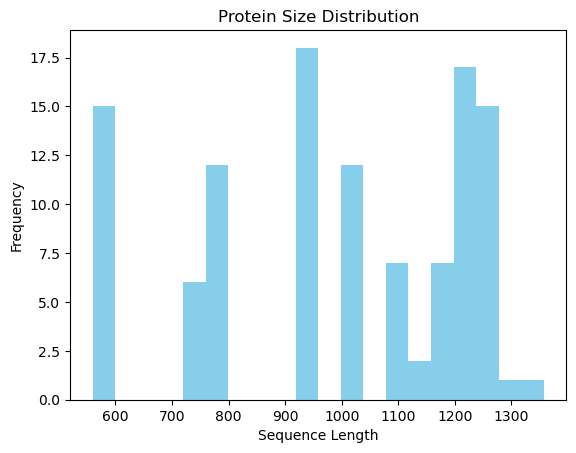

Lentivirus             18
Simplexvirus           16
Betacoronavirus        14
Varicellovirus         12
Cytomegalovirus        11
Rhadinovirus            9
Percavirus              5
Alphainfluenzavirus     5
Deltainfluenzavirus     5
Gammainfluenzavirus     4
Alphacoronavirus        4
Betainfluenzavirus      4
Mardivirus              2
Roseolovirus            2
Simiispumavirus         2
Name: genus, dtype: int64


In [8]:
# Copy the filtered_df to data
data = filtered_df.copy()

# Assuming you have X_test and data available
test_processor = TestDatasetProcessor(X_test, data)

# Prepare fasta file
test_processor.prepare_fasta_file()

# Visualize sequence lengths
test_processor.visualize_sequence_lengths()

# Save to CSV
test_df = test_processor.create_save_test_df()

# Analyze dataset composition
test_processor.analyze_dataset_composition()


#### Train Supervised ML Models and Test Their Performance in Classification of Viral Protein Sequences

In [57]:
import time
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd


class MachineLearningModels:
    def __init__(self, X_train_tf, y_train, X_test_tf, y_test):
        self.X_train_tf = X_train_tf
        self.y_train = y_train
        self.X_test_tf = X_test_tf
        self.y_test = y_test
        self.cpt_dict = {}
        self.metrics_dict = {}

    def train_naive_bayes(self):
        start_time = time.time()
        model = MultinomialNB()
        model.fit(self.X_train_tf, self.y_train)
        NB_pred_tr = model.predict(self.X_train_tf)
        NB_pred_te = model.predict(self.X_test_tf)
        end_time = time.time()
        total_time = end_time - start_time
        self.cpt_dict['Naive Bayes'] = total_time
        return NB_pred_tr, NB_pred_te

    def train_logistic_regression(self):
        start_time = time.time()
        lr_model = LogisticRegression(multi_class='ovr', max_iter=1000)
        lr_model.fit(self.X_train_tf, self.y_train)
        lr_predictions_tr = lr_model.predict(self.X_train_tf)
        lr_predictions_te = lr_model.predict(self.X_test_tf)
        end_time = time.time()
        total_time = end_time - start_time
        self.cpt_dict['Logistic Regression'] = total_time
        return lr_predictions_tr, lr_predictions_te

    def train_random_forest(self):
        start_time = time.time()
        rf_model = RandomForestClassifier()
        rf_model.fit(self.X_train_tf, self.y_train)
        rf_predictions_tr = rf_model.predict(self.X_train_tf)
        rf_predictions_te = rf_model.predict(self.X_test_tf)
        end_time = time.time()
        total_time = end_time - start_time
        self.cpt_dict['Random Forest'] = total_time
        return rf_predictions_tr, rf_predictions_te

    def train_support_vector_machine(self):
        start_time = time.time()
        svm_classifier = SVC(kernel='linear', C=0.1, gamma=0.1, decision_function_shape='ovr')
        svm_classifier.fit(self.X_train_tf, self.y_train)
        svm_pred_tr = svm_classifier.predict(self.X_train_tf)
        svm_pred_te = svm_classifier.predict(self.X_test_tf)
        end_time = time.time()
        total_time = end_time - start_time
        self.cpt_dict['Support Vector Machine'] = total_time
        return svm_pred_tr, svm_pred_te

    def get_metrics(self, y_test, y_predicted):
        accuracy = accuracy_score(y_test, y_predicted)
        precision = precision_score(y_test, y_predicted, average='weighted')
        recall = recall_score(y_test, y_predicted, average='weighted')
        f1 = f1_score(y_test, y_predicted, average='weighted')
        return accuracy, precision, recall, f1

    def print_classification_report(self, y_true, y_pred, label):
        report = classification_report(y_true, y_pred)
        print(f"{label} classification report:\n{report}\n")

    def print_confusion_matrix(self, y_true, y_pred, label):
        print(f"Confusion matrix for {label}:\n")
        print(pd.crosstab(pd.Series(y_true, name='Actual'), pd.Series(y_pred, name='Predicted')))
        accuracy, precision, recall, f1 = self.get_metrics(y_true, y_pred)
        print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))
        
    def store_metrics(self, model_name, y_true, y_pred):
        accuracy = accuracy_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred, average='weighted')
        recall = recall_score(y_true, y_pred, average='weighted')
        f1 = f1_score(y_true, y_pred, average='weighted')

        self.metrics_dict[model_name] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1 score': f1
        }

    def run_all_models(self):
        # Naive Bayes
        NB_pred_tr, NB_pred_te = self.train_naive_bayes()
        self.store_metrics('Naive Bayes', self.y_test, NB_pred_te)
        self.print_classification_report(self.y_train, NB_pred_tr, "Naive Bayes Training")
        self.print_classification_report(self.y_test, NB_pred_te, "Naive Bayes Testing")
        self.print_confusion_matrix(self.y_train, NB_pred_tr, "Naive Bayes Training")
        self.print_confusion_matrix(self.y_test, NB_pred_te, "Naive Bayes Testing")

        # Logistic Regression
        lr_predictions_tr, lr_predictions_te = self.train_logistic_regression()
        self.store_metrics('Logistic Regression', self.y_test, lr_predictions_te)
        self.print_classification_report(self.y_train, lr_predictions_tr, "Logistic Regression Training")
        self.print_classification_report(self.y_test, lr_predictions_te, "Logistic Regression Testing")
        self.print_confusion_matrix(self.y_train, lr_predictions_tr, "Logistic Regression Training")
        self.print_confusion_matrix(self.y_test, lr_predictions_te, "Logistic Regression Testing")

        # Random Forest
        rf_predictions_tr, rf_predictions_te = self.train_random_forest()
        self.store_metrics('Random Forest', self.y_test, rf_predictions_te)
        self.print_classification_report(self.y_train, rf_predictions_tr, "Random Forest Training")
        self.print_classification_report(self.y_test, rf_predictions_te, "Random Forest Testing")
        self.print_confusion_matrix(self.y_train, rf_predictions_tr, "Random Forest Training")
        self.print_confusion_matrix(self.y_test, rf_predictions_te, "Random Forest Testing")

        # Support Vector Machine
        svm_pred_tr, svm_pred_te = self.train_support_vector_machine()
        self.store_metrics('Support Vector Machine', self.y_test, svm_pred_te)
        self.print_classification_report(self.y_train, svm_pred_tr, "SVM Training")
        self.print_classification_report(self.y_test, svm_pred_te, "SVM Testing")
        self.print_confusion_matrix(self.y_train, svm_pred_tr, "SVM Training")
        self.print_confusion_matrix(self.y_test, svm_pred_te, "SVM Testing")


In [58]:
# Create an instance of MachineLearningModels with the provided data
ml_models = MachineLearningModels(X_train_tf, y_train, X_test_tf, y_test)

# Train models and evaluate performance
ml_models.run_all_models()

# Access computation times
computation_times_dict = ml_models.cpt_dict
print("\nComputation Times for Supervised ML Models:")
print(computation_times_dict)

# Access ML performance metrics data
metrics_dict = ml_models.metrics_dict
print("\nPerformance Metrics for Supervised ML Models:")
print(metrics_dict)

Naive Bayes Training classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        23
           1       1.00      1.00      1.00        20
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00        42
           5       1.00      1.00      1.00        14
           6       1.00      1.00      1.00        10
           7       1.00      1.00      1.00        81
           8       1.00      1.00      1.00         8
           9       1.00      1.00      1.00         9
          10       1.00      1.00      1.00        27
          11       1.00      1.00      1.00        24
          12       1.00      1.00      1.00        12
          13       1.00      1.00      1.00        73
          14       1.00      1.00      1.00        39

    accuracy                           1.00       448
   macro avg       1.00      1.00   

#### Train KMeans and Test its Performance in Classification of Viral Protein Sequences

In [16]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.cluster import KMeans

class KMeansAnalyzer:
    def __init__(self, X_train_tf, X_test_tf, y_train, y_test):
        self.X_train_tf = X_train_tf
        self.X_test_tf = X_test_tf
        self.y_train = y_train
        self.y_test = y_test
        self.accuracy_list_tr = []
        self.precision_list_tr = []
        self.recall_list_tr = []
        self.f1_list_tr = []
        self.accuracy_list_te = []
        self.precision_list_te = []
        self.recall_list_te = []
        self.f1_list_te = []
        self.cpt_dict = {}
        self.accuracy_best = None
        self.precision_best = None
        self.recall_best = None
        self.f1_best = None

    def get_metrics(self, y_test, y_predicted):
        accuracy = accuracy_score(y_test, y_predicted)
        precision = precision_score(y_test, y_predicted, average='weighted')
        recall = recall_score(y_test, y_predicted, average='weighted')
        f1 = f1_score(y_test, y_predicted, average='weighted')
        return accuracy, precision, recall, f1
    
    def train_kmeans(self, n_clusters_range=(20, 61)):
        start_time = time.time()

        for n in range(*n_clusters_range):
            km1 = KMeans(n_clusters=n, max_iter=300, tol=0.0001, random_state=43, verbose=0).fit(self.X_train_tf)
            km_pred_tr = km1.predict(self.X_train_tf)
            km_pred_te = km1.predict(self.X_test_tf)

            # Creat a lookup dictionary to map the KMeans labels to true labels
            KMeans_mapping = {n:None for n in range(n)}
            for i in range(len(self.y_train)):
                if KMeans_mapping[km_pred_tr[i]] == None:
                    KMeans_mapping[km_pred_tr[i]] = [self.y_train[i]]
                else:
                    KMeans_mapping[km_pred_tr[i]].append(self.y_train[i])

            label_lookup = dict()
            for key in KMeans_mapping.keys():
                sub_dict = Counter(KMeans_mapping[key])
                if len(sub_dict) > 1:
                    max = 0
                    for subkey in sub_dict.keys():           
                        if sub_dict[subkey] > max:
                            max = sub_dict[subkey]
                            key_select = subkey
                    label_lookup[key] = key_select
                else:
                    label_lookup[key] = list(set(KMeans_mapping[key]))[0]

            # Use the label_lookup dictionary to convert predicted labels from X_train_tf 
            # for KMeans model performance analysis.
            km_pred_tr_converted = np.asarray([label_lookup[key] for key in km_pred_tr])
            km_pred_te_converted = np.asarray([label_lookup[key] for key in km_pred_te])

            # Compute the metrics scores for the train dataset
            accuracy_1, precision_1, recall_1, f1_1 = self.get_metrics(y_train, km_pred_tr_converted)
            self.accuracy_list_tr.append(accuracy_1)
            self.precision_list_tr.append(precision_1)
            self.recall_list_tr.append(recall_1)
            self.f1_list_tr.append(f1_1)

            # Compute the metrics scores for the test dataset
            accuracy_2, precision_2, recall_2, f1_2 = self.get_metrics(y_test, km_pred_te_converted)
            self.accuracy_list_te.append(accuracy_2)
            self.precision_list_te.append(precision_2)
            self.recall_list_te.append(recall_2)
            self.f1_list_te.append(f1_2)

        end_time = time.time()
        total_time = end_time - start_time
        self.cpt_dict['KMeans'] = total_time
        print("Total computation time for KMeans: {:.2f} seconds".format(total_time))

    def visualize_metrics(self, n_clusters_range=range(20, 61)):
        # Create subplots with four axes
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

        # Plot Accuracy for train and test datasets
        axes[0, 0].plot(n_clusters_range, self.accuracy_list_tr, marker='o', linestyle='-', color='blue', label='Train')
        axes[0, 0].plot(n_clusters_range, self.accuracy_list_te, marker='o', linestyle='-', color='red', label='Test')
        axes[0, 0].set_title('Accuracy vs. Number of Clusters', fontsize=16)  # Increase the font size
        axes[0, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[0, 0].set_ylabel('Accuracy', fontsize=14)  # Increase the font size
        axes[0, 0].legend()

        # Plot Precision for train and test datasets
        axes[0, 1].plot(n_clusters_range, self.precision_list_tr, marker='o', linestyle='-', color='blue', label='Train')
        axes[0, 1].plot(n_clusters_range, self.precision_list_te, marker='o', linestyle='-', color='red', label='Test')
        axes[0, 1].set_title('Precision vs. Number of Clusters', fontsize=16)  # Increase the font size
        axes[0, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[0, 1].set_ylabel('Precision', fontsize=14)  # Increase the font size
        axes[0, 1].legend()

        # Plot Recall for train and test datasets
        axes[1, 0].plot(n_clusters_range, self.recall_list_tr, marker='o', linestyle='-', color='blue', label='Train')
        axes[1, 0].plot(n_clusters_range, self.recall_list_te, marker='o', linestyle='-', color='red', label='Test')
        axes[1, 0].set_title('Recall vs. Number of Clusters', fontsize=16)  # Increase the font size
        axes[1, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[1, 0].set_ylabel('Recall', fontsize=14)  # Increase the font size
        axes[1, 0].legend()

        # Plot F1 Score for train and test datasets
        axes[1, 1].plot(n_clusters_range, self.f1_list_tr, marker='o', linestyle='-', color='blue', label='Train')
        axes[1, 1].plot(n_clusters_range, self.f1_list_te, marker='o', linestyle='-', color='red', label='Test')
        axes[1, 1].set_title('F1 Score vs. Number of Clusters', fontsize=16)  # Increase the font size
        axes[1, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[1, 1].set_ylabel('F1 Score', fontsize=14)  # Increase the font size
        axes[1, 1].legend()

        # Adjust spacing between subplots
        plt.tight_layout()

        # Save the plots as PNG files
        plt.savefig("KMeans_metrics_plots.png", format='png', dpi=600)

        # Show the plots
        plt.show()

    def save_metrics_csv(self, n_clusters_range=range(20, 61)):
        # Create a dictionary to store four lists: accuracy_list, precision_list, recall_list, and f1_list
        KMeans_dict = {'n_Clusters':list(n_clusters_range), 'Accuracy': self.accuracy_list_te, 
                       'Precision': self.precision_list_te, 'Recall': self.recall_list_te, 
                       'F1 Score': self.f1_list_te}

        # Create a Pandas DataFrame
        KMeans_metrics = pd.DataFrame(KMeans_dict)

        # Save the KMeans_metrics DataFrame as a CSV file
        KMeans_metrics.to_csv("KMeans_metrics.csv", index=False)
        return KMeans_metrics

    def evaluate_single_kmeans(self, n_clusters):
        # compute the performance metrics when n_clusters = the defined n
        km1 = KMeans(n_clusters = n_clusters, max_iter = 300, tol = 0.0001, random_state=43, verbose=0).fit(X_train_tf)
        km_pred_tr = km1.predict(self.X_train_tf)
        km_pred_te = km1.predict(self.X_test_tf)

        # Creat a lookup dictionary to map the KMeans labels to true labels
        KMeans_mapping = {n:None for n in range(n_clusters)}
        for i in range(len(self.y_train)):
            if KMeans_mapping[km_pred_tr[i]] == None:
                KMeans_mapping[km_pred_tr[i]] = [self.y_train[i]]
            else:
                KMeans_mapping[km_pred_tr[i]].append(self.y_train[i])

        label_lookup = dict()
        for key in KMeans_mapping.keys():
            sub_dict = Counter(KMeans_mapping[key])
            if len(sub_dict) > 1:
                max = 0
                for subkey in sub_dict.keys():           
                    if sub_dict[subkey] > max:
                        max = sub_dict[subkey]
                        key_select = subkey
                label_lookup[key] = key_select
            else:
                label_lookup[key] = list(set(KMeans_mapping[key]))[0]

        # Use the label_lookup dictionary to convert predicted labels from X_test_tf 
        # for KMeans model performance analysis.
        km_pred_te_converted = np.asarray([label_lookup[key] for key in km_pred_te])


        # Create a confusion matrix and Compute the metrics scores for the test dataset
        print("Confusion matrix for predictions on protein sequences for testing the trained KMean model\n")
        print(pd.crosstab(pd.Series(self.y_test, name='Actual'), pd.Series(km_pred_te_converted, name='Predicted')))
        
        accuracy, precision, recall, f1 = self.get_metrics(self.y_test, km_pred_te_converted)
        print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))
        self.accuracy_best = accuracy
        self.precision_best = precision
        self.recall_best = recall
        self.f1_best = f1



In [17]:
# Parse X_train_tf, X_test_tf, y_train, y_test into the class KMeanAnalyzer and initiate it
km_analyzer = KMeansAnalyzer(X_train_tf, X_test_tf, y_train, y_test)
km_analyzer.train_kmeans((15, 51))
computation_times_dict.update(km_analyzer.cpt_dict)
km_metrics = km_analyzer.save_metrics_csv(range(15, 51))
print(km_metrics)

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` 

Total computation time for KMeans: 172.73 seconds
    n_Clusters  Accuracy  Precision    Recall  F1 Score
0           15  0.796460   0.797472  0.796460  0.775342
1           16  0.778761   0.826393  0.778761  0.773334
2           17  0.743363   0.836538  0.743363  0.770633
3           18  0.831858   0.839918  0.831858  0.797081
4           19  0.831858   0.882076  0.831858  0.832897
5           20  0.778761   0.826393  0.778761  0.773334
6           21  0.849558   0.885977  0.849558  0.848212
7           22  0.902655   0.874961  0.902655  0.879285
8           23  0.849558   0.858819  0.849558  0.835225
9           24  0.911504   0.966323  0.911504  0.926203
10          25  0.876106   0.901391  0.876106  0.872046
11          26  0.876106   0.849937  0.876106  0.850120
12          27  0.929204   0.946376  0.929204  0.927079
13          28  0.911504   0.943110  0.911504  0.913000
14          29  0.929204   0.946376  0.929204  0.927079
15          30  0.955752   0.963597  0.955752  0.95419

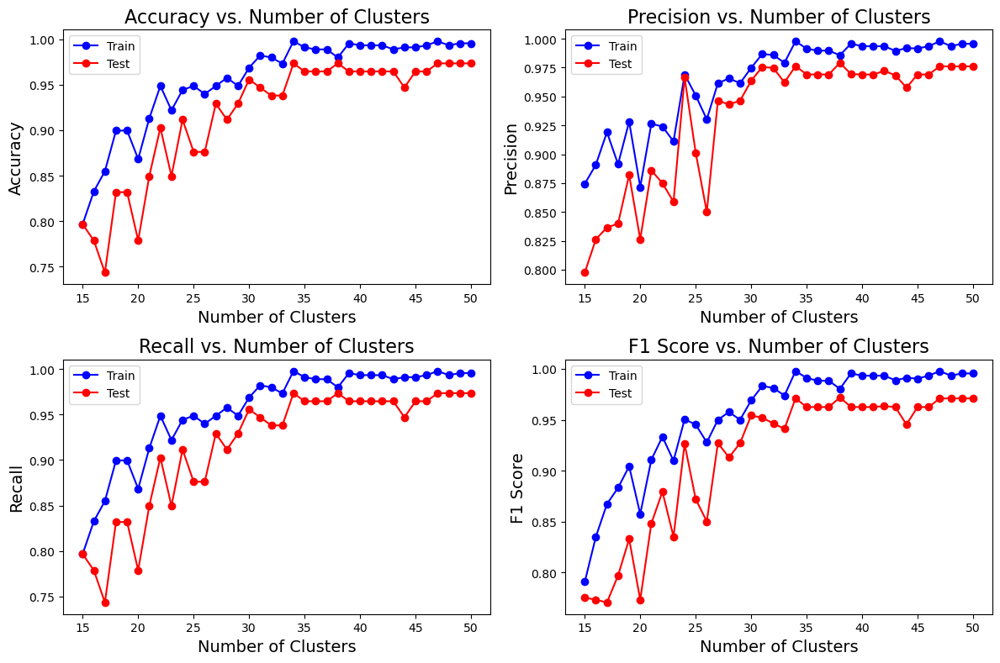

In [18]:
# Visualization of the changes in KMeans performance metrics along with changes in the n-clusters parameter
km_analyzer.visualize_metrics(range(15, 51))

In [19]:
# compute the performance metrics when n_clusters = 34
km_analyzer.evaluate_single_kmeans(34)

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Confusion matrix for predictions on protein sequences for testing the trained KMean model

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0           4   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0   5   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  14   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   4   0   0   0   0   0   0   0   0   0   0   0
4           0   0   0   0  11   0   0   0   0   0   0   0   0   0   0
5           0   0   0   0   0   5   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   4   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  18   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   1   0   0   0   0   0   1
9           0   0   0   0   0   0   0   0   0   5   0   0   0   0   0
10          0   0   0   0   0   0   0   0   0   1   8   0   0   0   0

In [20]:
# Store KMeans performance metrics in a dictionary
metrics_dict['KMeans'] = {'accuracy':km_analyzer.accuracy_best, 'precision':km_analyzer.precision_best,
                         'recall':km_analyzer.recall_best, 'f1 score':km_analyzer.f1_best}

#### Train AgglomerativeClustering and Test its Performance in Classification of Viral Protein Sequences

In [47]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import train_test_split

class AgglomerativeAnalyzer:
    def __init__(self, sequences, genus_labels):
        self.sequences = sequences
        self.genus_labels = genus_labels
        self.cpt_dict = {}
        self.accuracy_list = []
        self.precision_list = []
        self.recall_list = []
        self.f1_list = []
        self.accuracy_best = None
        self.precision_best = None
        self.recall_best = None
        self.f1_best = None

    def preprocess_data(self):
        vect = CountVectorizer(analyzer='char_wb', ngram_range=(4, 4))
        X, _, y, _ = train_test_split(self.sequences, self.genus_labels, test_size=None, random_state=42)
        vect.fit(X)
        self.X_transformed = vect.transform(X)
        self.y = y

    def get_metrics(self, y_test, y_predicted):
        accuracy = accuracy_score(y_test, y_predicted)
        precision = precision_score(y_test, y_predicted, average='weighted')
        recall = recall_score(y_test, y_predicted, average='weighted')
        f1 = f1_score(y_test, y_predicted, average='weighted')
        return accuracy, precision, recall, f1
    
    def train_agglomerative(self, n_clusters_range=(20, 61)):
        start_time = time.time()

        for n in range(*n_clusters_range):
            agg_clustering = AgglomerativeClustering(n_clusters=n, linkage='ward', compute_full_tree=True)
            agg_pred = agg_clustering.fit_predict(self.X_transformed.toarray())

            # Creat a lookup dictionary to map the AgglomerativeClustering labels to true labels
            agg_mapping = {n:None for n in range(n)}
            for i in range(len(self.y)):
                if agg_mapping[agg_pred[i]] == None:
                    agg_mapping[agg_pred[i]] = [self.genus_labels[i]]
                else:
                    agg_mapping[agg_pred[i]].append(self.y[i])

            agg_label_lookup = dict()
            for key in agg_mapping.keys():
                sub_dict = Counter(agg_mapping[key])
                if len(sub_dict) > 1:
                    max = 0
                    for subkey in sub_dict.keys():           
                        if sub_dict[subkey] > max:
                            max = sub_dict[subkey]
                            key_select = subkey
                    agg_label_lookup[key] = key_select
                else:
                    agg_label_lookup[key] = list(set(agg_mapping[key]))[0]

            # Use the label_lookup dictionary to convert predicted labels from X for 
            # AgglomerativeClustering model performance analysis.
            agg_pred_converted = np.asarray([agg_label_lookup[key] for key in agg_pred])

            # Compute the metrics scores
            accuracy, precision, recall, f1 = self.get_metrics(self.y, agg_pred_converted)
            self.accuracy_list.append(accuracy)
            self.precision_list.append(precision)
            self.recall_list.append(recall)
            self.f1_list.append(f1)

        end_time = time.time()
        total_time = end_time - start_time
        self.cpt_dict['AgglomerativeClustering'] = total_time
        print("Total computation time for AgglomerativeClustering: {:.2f} seconds".format(total_time))

    def visualize_metrics(self, n_clusters_range=range(20, 61)):
        # Create subplots with four axes
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

        # Plot Accuracy
        axes[0, 0].plot(n_clusters_range, self.accuracy_list, marker='o', linestyle='-')
        axes[0, 0].set_title('Accuracy vs. Number of Clusters')
        axes[0, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[0, 0].set_ylabel('Accuracy', fontsize=14)  # Increase the font size

        # Plot Precision
        axes[0, 1].plot(n_clusters_range, self.precision_list, marker='o', linestyle='-')
        axes[0, 1].set_title('Precision vs. Number of Clusters')
        axes[0, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[0, 1].set_ylabel('Precision', fontsize=14)  # Increase the font size

        # Plot Recall
        axes[1, 0].plot(n_clusters_range, self.recall_list, marker='o', linestyle='-')
        axes[1, 0].set_title('Recall vs. Number of Clusters')
        axes[1, 0].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[1, 0].set_ylabel('Recall', fontsize=14)  # Increase the font size

        # Plot F1 Score
        axes[1, 1].plot(n_clusters_range, self.f1_list, marker='o', linestyle='-')
        axes[1, 1].set_title('F1 Score vs. Number of Clusters')
        axes[1, 1].set_xlabel('Number of Clusters', fontsize=14)  # Increase the font size
        axes[1, 1].set_ylabel('F1 Score', fontsize=14)  # Increase the font size

        # Adjust spacing between subplots
        plt.tight_layout()

        # Save the plots as an image file
        plt.savefig("AgglomerativeClustering_metrics.png", format='png', dpi=600, bbox_inches='tight')

        # Show the plots
        plt.show()

    def save_metrics_csv(self, n_clusters_range=range(20, 61)):
        # Create a dictionary using four lists: accuracy_list, precision_list, recall_list, and f1_list
        Agglo_dict = {'n_Clusters':list(n_clusters_range), 'Accuracy': self.accuracy_list, 'Precision': self.precision_list, 
                       'Recall': self.recall_list, 'F1 Score': self.f1_list}

        # Create a Pandas DataFrame
        Agglo_metrics = pd.DataFrame(Agglo_dict)

        # Save the Agglo_metrics DataFrame as a CSV file
        Agglo_metrics.to_csv("AgglomerativeClustering_metrics.csv", index = False)

        return Agglo_metrics

    def evaluate_single_agglomerative(self, n_clusters):
        # Compute the performance metrics based on n_clusters
        agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', compute_full_tree=True).fit(self.X_transformed.toarray())
        agg_pred = agg_clustering.fit_predict(self.X_transformed.toarray())

        # Creat a lookup dictionary to map the AgglomerativeClustering labels to true labels
        agg_mapping = {n:None for n in range(n_clusters)}
        for i in range(len(self.y)):
            if agg_mapping[agg_pred[i]] == None:
                agg_mapping[agg_pred[i]] = [self.genus_labels[i]]
            else:
                agg_mapping[agg_pred[i]].append(self.y[i])

        agg_label_lookup = dict()
        for key in agg_mapping.keys():
            sub_dict = Counter(agg_mapping[key])
            if len(sub_dict) > 1:
                max = 0
                for subkey in sub_dict.keys():           
                    if sub_dict[subkey] > max:
                        max = sub_dict[subkey]
                        key_select = subkey
                agg_label_lookup[key] = key_select
            else:
                agg_label_lookup[key] = list(set(agg_mapping[key]))[0]

        # Use the label_lookup dictionary to convert predicted labels from X for 
        # AgglomerativeClustering model performance analysis.
        agg_pred_converted = np.asarray([agg_label_lookup[key] for key in agg_pred])
        
        # Create a confusion matrix and Compute the metrics scores for the test dataset
        print("Confusion matrix for predictions on protein sequences for testing the trained AgglomerativeClustering model\n")
        print(pd.crosstab(pd.Series(self.y, name='Actual'), pd.Series(agg_pred_converted, name='Predicted')))

        # Compute the metrics scores
        accuracy, precision, recall, f1 = self.get_metrics(self.y, agg_pred_converted)
        print("accuracy = %.3f \nprecision = %.3f \nrecall = %.3f \nf1 = %.3f" % (accuracy, precision, recall, f1))
        self.accuracy_best = accuracy
        self.precision_best = precision
        self.recall_best = recall
        self.f1_best = f1


In [48]:
# Parse sequences and genus_labels into the class AgglomerativeAnalyzer and initiate it
agg_analyzer = AgglomerativeAnalyzer(sequences, genus_labels)
agg_analyzer.preprocess_data()
agg_analyzer.train_agglomerative((15, 51))
computation_times_dict.update(agg_analyzer.cpt_dict)
agg_metrics = agg_analyzer.save_metrics_csv(range(15, 51))
print(agg_metrics)

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedM

Total computation time for AgglomerativeClustering: 97.28 seconds
    n_Clusters  Accuracy  Precision    Recall  F1 Score
0           15  0.785714   0.761825  0.785714  0.749341
1           16  0.807143   0.795499  0.807143  0.778561
2           17  0.845238   0.790632  0.845238  0.806013
3           18  0.845238   0.790632  0.845238  0.806013
4           19  0.888095   0.865002  0.888095  0.867030
5           20  0.907143   0.892297  0.907143  0.892045
6           21  0.907143   0.892297  0.907143  0.892045
7           22  0.921429   0.921846  0.921429  0.914198
8           23  0.921429   0.921846  0.921429  0.914198
9           24  0.921429   0.921846  0.921429  0.914198
10          25  0.921429   0.921846  0.921429  0.914198
11          26  0.930952   0.928341  0.930952  0.923908
12          27  0.938095   0.952681  0.938095  0.937355
13          28  0.950000   0.955891  0.950000  0.946965
14          29  0.961905   0.969435  0.961905  0.962209
15          30  0.961905   0.969435  0

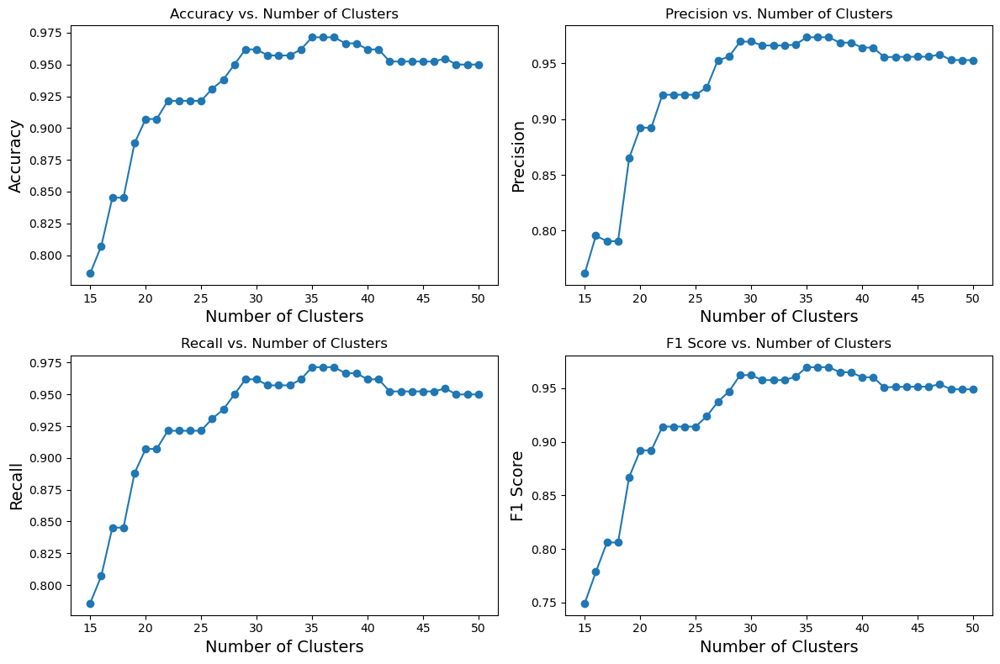

In [49]:
# Visualization of the changes in AgglomerativeClustering performance metrics 
# along with changes in the n-clusters parameter
agg_analyzer.visualize_metrics(range(15, 51))

In [50]:
# Compute the performance metrics when n_clusters = 35
agg_analyzer.evaluate_single_agglomerative(35)

Confusion matrix for predictions on protein sequences for testing the trained AgglomerativeClustering model

Predicted  0   1   2   3   4   5   6   7   8   9   10  11  12  13  14
Actual                                                               
0          18   0   0   0   0   0   0   0   0   0   0   0   0   0   0
1           0  16   0   0   0   0   0   0   0   0   0   0   0   0   0
2           0   0  50   0   0   0   0   0   0   0   0   0   0   0   0
3           0   0   0   8   0   0   0   0   0   0   0   1   0   0   0
4           0   0   0   0  39   0   0   1   0   0   0   0   0   0   0
5           0   0   0   0   0  15   0   0   0   0   0   0   0   0   0
6           0   0   0   0   0   0   9   0   0   0   0   0   0   0   0
7           0   0   0   0   0   0   0  74   0   0   0   0   0   0   0
8           0   0   0   0   0   0   0   0   5   0   0   0   0   0   3
9           0   0   0   0   0   0   0   0   0   6   4   0   0   0   0
10          0   0   0   0   0   0   0   0   0   0  

In [55]:
# Save and display the computation times of ML models
computation_times_df = pd.DataFrame(computation_times_dict, index = ['Time (sec)'])
computation_times_df.to_csv("ML_computation_times.csv", index = False)
computation_times_df

,Naive Bayes,Logistic Regression,Random Forest,Support Vector Machine,KMeans,AgglomerativeClustering
Time (sec),0.035601,3.799263,0.827598,1.964862,172.73067,97.278158


In [59]:
# Store the ML performance metrics in a dictionary and convert it to a data frame
metrics_dict['AgglomerativeClustering'] = {'accuracy':agg_analyzer.accuracy_best, 
                                           'precision':agg_analyzer.precision_best,
                                           'recall':agg_analyzer.recall_best, 
                                           'f1 score':agg_analyzer.f1_best}

# Create a Pandas DataFrame
metrics_df = pd.DataFrame(metrics_dict)

# Save the ML performance metrics DataFrame as a CSV file
metrics_df.to_csv("ML_performance_metrics.csv", index = False)

# Display the DataFrame
metrics_df

,Naive Bayes,Logistic Regression,Random Forest,Support Vector Machine,AgglomerativeClustering
accuracy,0.991150,0.991150,0.982301,0.982301,0.971429
precision,0.991831,0.991831,0.983867,0.983867,0.973294
recall,0.991150,0.991150,0.982301,0.982301,0.971429
f1 score,0.989853,0.989853,0.979761,0.979761,0.969631


#### Visualization of the Relationship Between Protein Sequence Clusters and Viral Genera

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap

class SequenceVisualizer:
    def __init__(self, X, y, labels_categories_mapping):
        self.X = X
        self.y = y
        self.labels_categories_mapping = labels_categories_mapping

    def visualize_with_tsne(self):
        y_cat = np.asarray([self.labels_categories_mapping[e] for e in self.y])
        tsne_model = TSNE(n_components=2, perplexity=30, random_state=34)
        tsne_results = tsne_model.fit_transform(self.X.toarray())
        self._plot_results(tsne_results, y_cat, 't-SNE')

    def visualize_with_umap(self):
        y_cat = np.asarray([self.labels_categories_mapping[e] for e in self.y])
        umap_model = umap.UMAP(n_components=2, n_neighbors=10, min_dist=0.1, metric='euclidean', random_state=34)
        umap_results = umap_model.fit_transform(self.X.toarray())
        self._plot_results(umap_results, y_cat, 'UMAP')

    def _plot_results(self, results, y_cat, title):
        plt.figure(figsize=(10, 8), dpi=600)
        unique_labels = np.unique(y_cat)
        colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

        for i, label in enumerate(unique_labels):
            mask = (y_cat == label)
            jitter = 1.5
            jitter_x = np.random.uniform(-jitter, jitter, size=sum(mask))
            jitter_y = np.random.uniform(-jitter, jitter, size=sum(mask))

            plt.scatter(
                results[mask, 0] + jitter_x,
                results[mask, 1] + jitter_y,
                label=label,
                c=[colors[i]],
                alpha=0.8,
                s=50,
            )

        plt.title(f'{title} 2D Plot with Colored Labels', fontsize=16)
        plt.xlabel(f'{title} Dimension 1', fontsize=14)
        plt.ylabel(f'{title} Dimension 2', fontsize=14)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.savefig(f"{title}_plot.png", format='png', dpi=600, bbox_inches='tight')
        plt.show()


C:\Users\pklo9\anaconda3\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\pklo9\anaconda3\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\pklo9\anaconda3\Lib\site-packages\umap\distances.py:1086: NumbaDeprecationWarning: The 'nopython' keywo

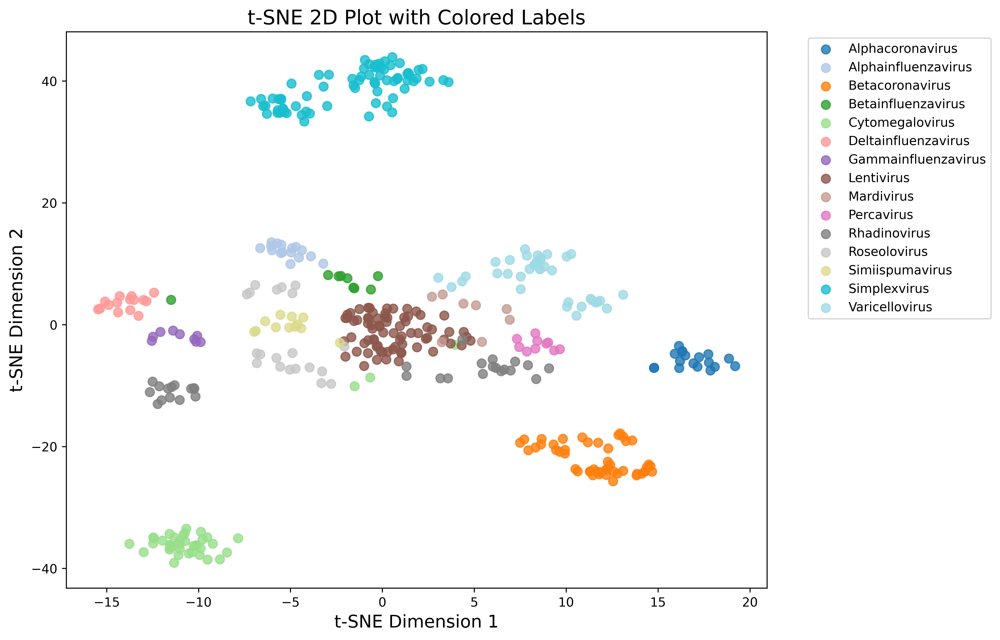

C:\Users\pklo9\anaconda3\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


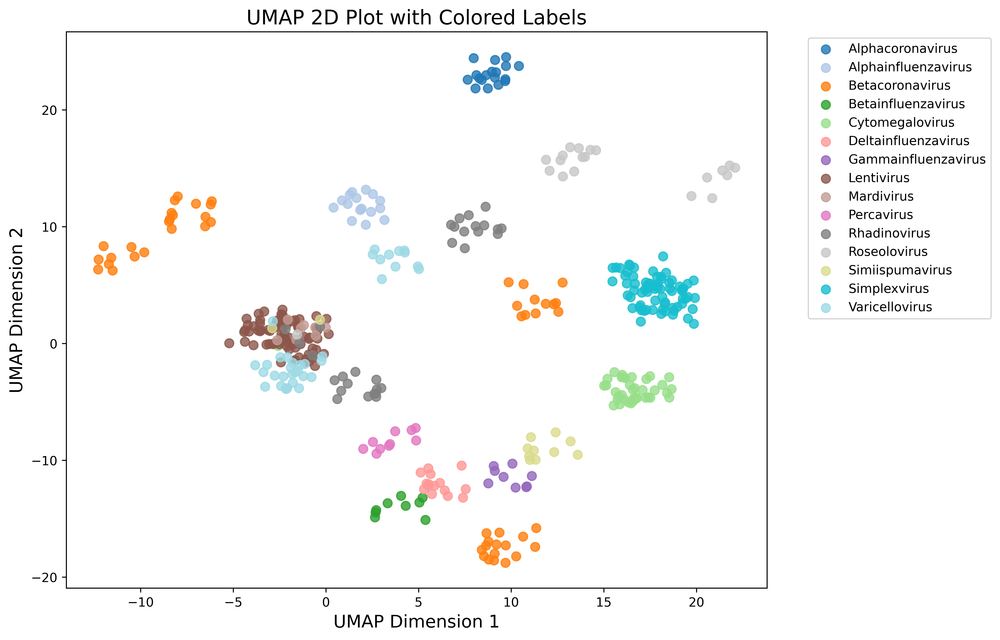

In [61]:
# Parse X, y, and labels_categories_mapping to initiate the class for sequence visualization
visualizer = SequenceVisualizer(agg_analyzer.X_transformed, agg_analyzer.y, labels_categories_mapping)
visualizer.visualize_with_tsne()
visualizer.visualize_with_umap()

#### Phylogenetic Tree Analysis of 113 Viral Protein Sequences from the Test Dataset

In [64]:
import matplotlib
import matplotlib.pyplot as plt
from Bio import Phylo

class PhylogeneticTreeAnalyzer:
    def __init__(self):
        pass  # You can add any necessary initialization here

    def plot_tree(self, treedata, output_file):
        tree = Phylo.read(treedata, "newick")
        matplotlib.rc('font', size=7.5)
        fig = plt.figure(figsize=(11, 20), dpi=600)
        axes = fig.add_subplot(1, 1, 1)
        Phylo.draw(tree, axes=axes, do_show=False)
        plt.savefig(output_file, format='png', dpi=600, bbox_inches='tight')
        plt.show()

# initiate the class
tree_analyzer = PhylogeneticTreeAnalyzer()


In [65]:
# Phylogenetic Tree based on Clustal Omega MSA
treedata_clustal = "ClustalO_phylotree.txt"
output_file_clustal = "Clustalo_tree.png"
tree_analyzer.plot_tree(treedata_clustal, output_file_clustal)

In [66]:
# Phylogenetic Tree based on Muscle MSA
treedata_muscle = "Muscle_phylotree.txt"
output_file_muscle = "Muscle_tree.png"
tree_analyzer.plot_tree(treedata_muscle, output_file_muscle)

#### The information of the python version and packages used in the session

In [67]:
import sys
import platform

# Display Python version
print("Python version:", sys.version)

# Display information of packages used in the current session
print("Packages used in the current session:")
for module_name, module in sys.modules.items():
    if hasattr(module, "__version__"):
        print(f"{module_name}: {module.__version__}")

# Display additional system information
print("\nSystem information:")
print("Platform:", platform.platform())
print("Processor architecture:", platform.architecture())
print("Machine type:", platform.machine())

Python version: 3.11.4 | packaged by Anaconda, Inc. | (main, Jul  5 2023, 13:38:37) [MSC v.1916 64 bit (AMD64)]
Packages used in the current session:
re: 2.2.1
ipykernel._version: 6.19.2
json: 2.0.9
jupyter_client._version: 7.4.9
traitlets._version: 5.7.1
traitlets: 5.7.1
logging: 0.5.1.2
zlib: 1.0
platform: 1.0.8
zmq.sugar.version: 23.2.0
zmq.sugar: 23.2.0
zmq: 23.2.0
ipaddress: 1.0
_ctypes: 1.1.0
ctypes: 1.1.0
colorama: 0.4.6
socketserver: 0.4
argparse: 1.1
dateutil: 2.8.2
six: 1.16.0
_decimal: 1.70
decimal: 1.70
jupyter_core.version: 5.3.0
jupyter_core: 5.3.0
platformdirs.version: 2.5.2
platformdirs: 2.5.2
entrypoints: 0.4
jupyter_client: 7.4.9
ipykernel: 6.19.2
IPython.core.release: 8.12.0
executing.version: 0.8.3
executing: 0.8.3
pure_eval.version: 0.2.2
pure_eval: 0.2.2
stack_data.version: 0.2.0
stack_data: 0.2.0
pygments: 2.15.1
pickleshare: 0.7.5
backcall: 0.2.0
decorator: 5.1.1
wcwidth: 0.2.5
prompt_toolkit: 3.0.36
parso: 0.8.3
jedi: 0.18.1
urllib.request: 3.11
IPython: 8.12.0